# Классификация персонажей One Piece с помощью CNN
## ResNet50 vs EfficientNetB0 (PyTorch)

**Задача:** 18-классовая классификация персонажей аниме One Piece

## 1. Импорты и конфигурация

In [3]:
import os, copy, time, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from PIL import Image
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, transforms, models
from torchvision.models import ResNet50_Weights, EfficientNet_B0_Weights
from tqdm import tqdm

import kagglehub

from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, precision_score, recall_score, f1_score
)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'PyTorch  : {torch.__version__}')
print(f'Device   : {DEVICE}')
if DEVICE.type == 'cuda':
    print(f'GPU      : {torch.cuda.get_device_name(0)}')

SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

PyTorch  : 2.11.0+cu128
Device   : cuda
GPU      : NVIDIA GeForce GTX 1660 SUPER


## 2. Конфигурация датасета

**⬇ Укажите путь к датасету в переменной DATASET_PATH**

In [4]:
# Download latest version
DATASET_PATH = kagglehub.dataset_download("ibrahimserouis99/one-piece-image-classifier")+"/Data/Data"

print("Path to dataset files:", DATASET_PATH)

CLASS_NAMES = [
    'Ace','Akainu','Brook','Chopper','Crocodile',
    'Franky','Jinbei','Kurohige','Law','Luffy',
    'Mihawk','Nami','Rayleigh','Robin','Sanji',
    'Shanks','Usopp','Zoro'
]

IMG_SIZE      = 224
BATCH_SIZE    = 32
NUM_CLASSES   = 18
EPOCHS_STAGE1 = 15
LR_STAGE1     = 1e-3
EPOCHS_STAGE2 = 15
LR_STAGE2     = 1e-5
UNFREEZE_N    = 30

print(f'Dataset    : {DATASET_PATH}')
print(f'Image size : {IMG_SIZE}x{IMG_SIZE}  Batch: {BATCH_SIZE}  Classes: {NUM_CLASSES}')

Resuming download from 1474297856 bytes (1243921734 bytes left)...
Resuming download to C:\Users\User\.cache\kagglehub\datasets\ibrahimserouis99\one-piece-image-classifier\23.archive (1474297856/2718219590) bytes left.


100%|██████████| 2.53G/2.53G [02:21<00:00, 8.76MB/s]

Extracting files...


Path to dataset files: C:\Users\User\.cache\kagglehub\datasets\ibrahimserouis99\one-piece-image-classifier\versions\23/Data/Data
Dataset    : C:\Users\User\.cache\kagglehub\datasets\ibrahimserouis99\one-piece-image-classifier\versions\23/Data/Data
Image size : 224x224  Batch: 32  Classes: 18


## 3. EDA — анализ данных

In [5]:
dataset_dir = Path(DATASET_PATH)

class_counts = {}
for cls in CLASS_NAMES:
    d = dataset_dir / cls
    imgs = list(d.glob('*.jpg')) + list(d.glob('*.png')) + list(d.glob('*.jpeg')) if d.exists() else []
    class_counts[cls] = len(imgs)

total_images = sum(class_counts.values())
print(f'Всего изображений: {total_images}')
for cls, cnt in sorted(class_counts.items(), key=lambda x: -x[1]):
    print(f'  {cls:<12}: {cnt:>5}')

Всего изображений: 11737
  Nami        :   665
  Zoro        :   659
  Brook       :   657
  Luffy       :   654
  Akainu      :   651
  Crocodile   :   651
  Franky      :   651
  Jinbei      :   651
  Law         :   651
  Mihawk      :   651
  Rayleigh    :   651
  Robin       :   651
  Sanji       :   651
  Shanks      :   651
  Ace         :   648
  Chopper     :   648
  Kurohige    :   648
  Usopp       :   648


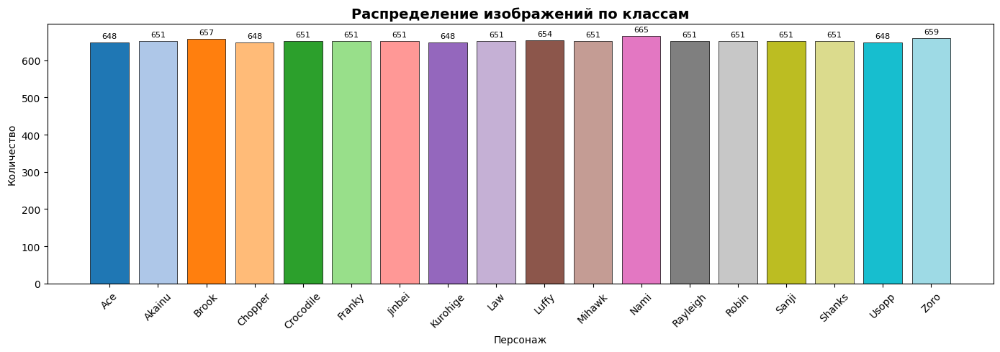

In [ ]:
fig, ax = plt.subplots(figsize=(14,5))
colors = plt.cm.tab20(np.linspace(0,1,NUM_CLASSES))
bars = ax.bar(class_counts.keys(), class_counts.values(), color=colors, edgecolor='black', lw=0.5)
for bar, val in zip(bars, class_counts.values()):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+8, str(val), ha='center', va='bottom', fontsize=8)
ax.set_title('Распределение изображений по классам', fontsize=14, fontweight='bold')
ax.set_xlabel('Персонаж'); ax.set_ylabel('Количество'); ax.tick_params(axis='x', rotation=45)
plt.tight_layout(); plt.savefig('artifacts/class_distribution.png', dpi=150, bbox_inches='tight'); plt.show()

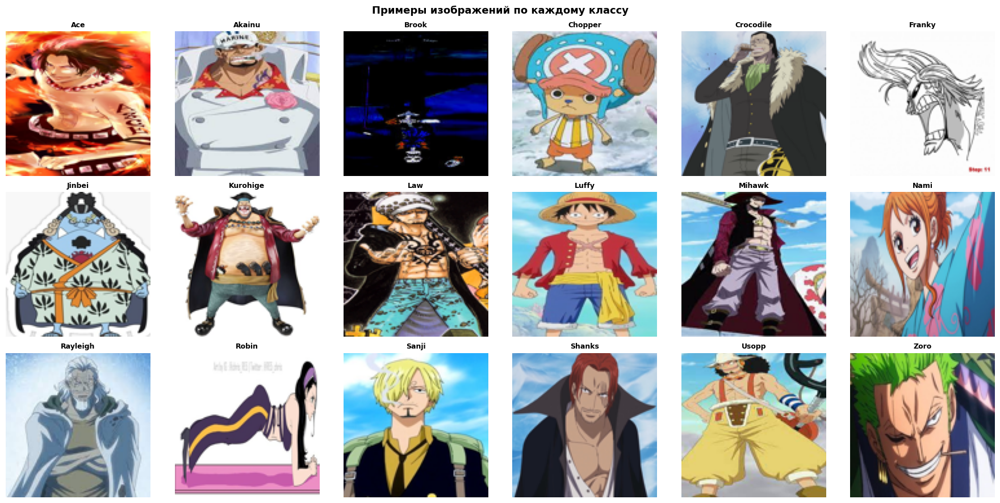

In [ ]:
fig, axes = plt.subplots(3, 6, figsize=(18,9))
for idx, cls in enumerate(CLASS_NAMES):
    d = dataset_dir / cls
    imgs = list(d.glob('*.jpg')) + list(d.glob('*.png')) + list(d.glob('*.jpeg'))
    ax = axes[idx // 6][idx % 6]
    if imgs: ax.imshow(Image.open(imgs[0]).convert('RGB').resize((112,112)))
    ax.set_title(cls, fontsize=9, fontweight='bold'); ax.axis('off')
plt.suptitle('Примеры изображений по каждому классу', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.savefig('artifacts/sample_images.png', dpi=150, bbox_inches='tight'); plt.show()

## 4. Подготовка данных и аугментация

In [8]:
MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]

train_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.RandomAffine(degrees=0, translate=(0.15,0.15), shear=10),
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.85,1.0)),
    transforms.ToTensor(),
    transforms.Normalize(mean=MEAN, std=STD)
])

val_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=MEAN, std=STD)
])

full_ds = datasets.ImageFolder(DATASET_PATH)
n_total = len(full_ds)
n_val   = int(0.2 * n_total)
n_train = n_total - n_val

gen = torch.Generator().manual_seed(SEED)
indices = torch.randperm(n_total, generator=gen).tolist()
train_idx, val_idx = indices[:n_train], indices[n_train:]

train_ds_all = datasets.ImageFolder(DATASET_PATH, transform=train_tf)
val_ds_all   = datasets.ImageFolder(DATASET_PATH, transform=val_tf)

train_dataset = Subset(train_ds_all, train_idx)
val_dataset   = Subset(val_ds_all,   val_idx)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=2, pin_memory=(DEVICE.type=='cuda'))
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=2, pin_memory=(DEVICE.type=='cuda'))

idx_to_class    = {v: k for k, v in full_ds.class_to_idx.items()}
classes_ordered = [idx_to_class[i] for i in range(NUM_CLASSES)]

print(f'Train: {n_train}  |  Val: {n_val}')
print(f'Классы: {classes_ordered}')

Train: 9390  |  Val: 2347
Классы: ['Ace', 'Akainu', 'Brook', 'Chopper', 'Crocodile', 'Franky', 'Jinbei', 'Kurohige', 'Law', 'Luffy', 'Mihawk', 'Nami', 'Rayleigh', 'Robin', 'Sanji', 'Shanks', 'Usopp', 'Zoro']


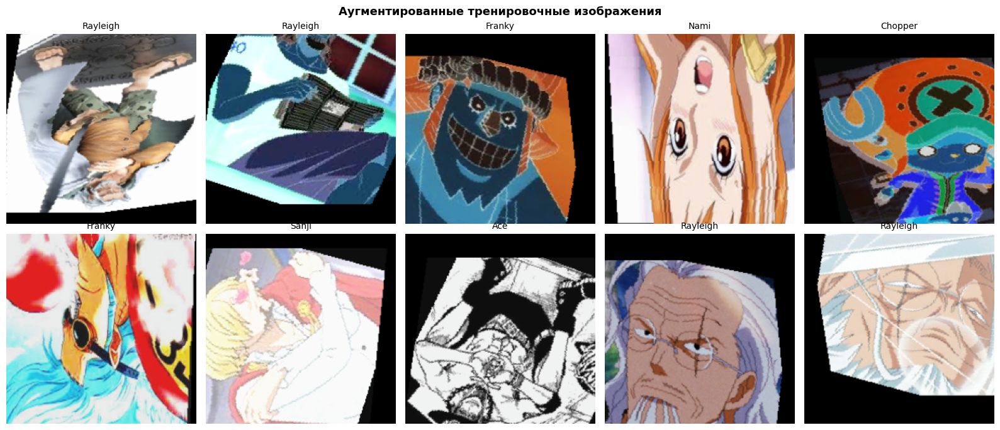

In [ ]:
mean_np = np.array(MEAN); std_np = np.array(STD)

def denorm(t):
    img = t.numpy().transpose(1,2,0)
    return np.clip(std_np * img + mean_np, 0, 1)

imgs_b, labels_b = next(iter(train_loader))
fig, axes = plt.subplots(2, 5, figsize=(16,7))
for i, ax in enumerate(axes.flatten()):
    ax.imshow(denorm(imgs_b[i])); ax.set_title(idx_to_class[labels_b[i].item()], fontsize=10); ax.axis('off')
plt.suptitle('Аугментированные тренировочные изображения', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.savefig('artifacts/augmented_samples.png', dpi=150, bbox_inches='tight'); plt.show()

## 5. Построение и обучение моделей
### 5.1 Вспомогательные функции

In [ ]:
def build_resnet50(freeze_base=True):
    m = models.resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
    if freeze_base:
        for p in m.parameters(): p.requires_grad = False
    m.fc = nn.Sequential(
        nn.Linear(m.fc.in_features, 512), nn.BatchNorm1d(512), nn.ReLU(True), nn.Dropout(0.4),
        nn.Linear(512, 256), nn.ReLU(True), nn.Dropout(0.3),
        nn.Linear(256, NUM_CLASSES)
    )
    return m


def build_efficientnet(freeze_base=True):
    m = models.efficientnet_b0(weights=EfficientNet_B0_Weights.IMAGENET1K_V1)
    if freeze_base:
        for p in m.features.parameters(): p.requires_grad = False
    in_f = m.classifier[1].in_features
    m.classifier = nn.Sequential(
        nn.Dropout(0.3), nn.Linear(in_f, 512), nn.BatchNorm1d(512), nn.ReLU(True), nn.Dropout(0.4),
        nn.Linear(512, 256), nn.ReLU(True), nn.Dropout(0.3),
        nn.Linear(256, NUM_CLASSES)
    )
    return m


def unfreeze_last(model, n):
    for p in list(model.parameters())[-n:]: p.requires_grad = True
    tr  = sum(p.numel() for p in model.parameters() if p.requires_grad)
    tot = sum(p.numel() for p in model.parameters())
    print(f'  Trainable: {tr:,} / {tot:,}')


def train_one_epoch(model, loader, criterion, optimizer):
    model.train()
    loss_sum, correct, total = 0.0, 0, 0
    for imgs, labels in tqdm(loader, leave=False):
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        out  = model(imgs)
        loss = criterion(out, labels)
        loss.backward(); optimizer.step()
        loss_sum += loss.item() * len(labels)
        correct  += (out.argmax(1) == labels).sum().item()
        total    += len(labels)
    return loss_sum/total, correct/total


@torch.no_grad()
def evaluate(model, loader, criterion):
    model.eval()
    loss_sum, correct, total = 0.0, 0, 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        out = model(imgs)
        loss_sum += criterion(out, labels).item() * len(labels)
        correct  += (out.argmax(1) == labels).sum().item()
        total    += len(labels)
    return loss_sum/total, correct/total


def train_stage(model, train_loader, val_loader, epochs, lr, tag):
    criterion = nn.CrossEntropyLoss(label_smoothing=0.05)
    optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=lr)
    sched     = lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.3, patience=3, min_lr=1e-7)
    history   = {'tl':[],'vl':[],'ta':[],'va':[]}
    best_acc, best_w, pat = 0.0, copy.deepcopy(model.state_dict()), 0
    PATIENCE = 7
    print(f'\n--- {tag} | lr={lr} ---')
    for ep in range(1, epochs+1):
        t0 = time.time()
        tl, ta = train_one_epoch(model, train_loader, criterion, optimizer)
        vl, va = evaluate(model, val_loader, criterion)
        sched.step(vl)
        history['tl'].append(tl); history['vl'].append(vl)
        history['ta'].append(ta); history['va'].append(va)
        print(f'  Ep {ep:02d}/{epochs}  loss={tl:.4f} acc={ta:.4f}  val_loss={vl:.4f} val_acc={va:.4f}  [{time.time()-t0:.0f}s]')
        if va > best_acc:
            best_acc, best_w, pat = va, copy.deepcopy(model.state_dict()), 0
        else:
            pat += 1
            if pat >= PATIENCE: print('  EarlyStopping.'); break
    model.load_state_dict(best_w)
    print(f'  Best val_acc: {best_acc:.4f}')
    return history


def plot_history(h1, h2, name):
    acc = h1['ta']+h2['ta']; vacc = h1['va']+h2['va']
    loss= h1['tl']+h2['tl']; vloss= h1['vl']+h2['vl']
    sp  = len(h1['ta']); ep = range(1, len(acc)+1)
    fig, axes = plt.subplots(1,2,figsize=(15,5))
    fig.suptitle(f'История обучения — {name}', fontsize=14, fontweight='bold')
    for ax, tr, vl, title in zip(axes,[acc,loss],[vacc,vloss],['Accuracy','Loss']):
        ax.plot(ep, tr, 'b-o', ms=3, label='Train'); ax.plot(ep, vl, 'r-o', ms=3, label='Val')
        ax.axvline(sp, color='green', ls='--', lw=1.5, label='Fine-tuning')
        ax.set_title(title); ax.set_xlabel('Epoch'); ax.legend(); ax.grid(alpha=.3)
    plt.tight_layout(); plt.savefig(f'artifacts/{name}_history.png', dpi=150, bbox_inches='tight'); plt.show()


print('Все функции определены.')

Все функции определены.


### 5.2 Модель 1: ResNet50

In [11]:
print('='*55); print('МОДЕЛЬ 1: ResNet50'); print('='*55)
resnet = build_resnet50(freeze_base=True).to(DEVICE)
tr = sum(p.numel() for p in resnet.parameters() if p.requires_grad)
tot= sum(p.numel() for p in resnet.parameters())
print(f'Trainable / Total: {tr:,} / {tot:,}')

МОДЕЛЬ 1: ResNet50
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to C:\Users\User/.cache\torch\hub\checkpoints\resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:09<00:00, 11.3MB/s]


Trainable / Total: 1,186,066 / 24,694,098


In [12]:
h_r1 = train_stage(resnet, train_loader, val_loader, EPOCHS_STAGE1, LR_STAGE1, 'ResNet50 | Stage 1')


--- ResNet50 | Stage 1 | lr=0.001 ---


  Ep 01/15  loss=1.7380 acc=0.5233  val_loss=1.2855 val_acc=0.6817  [99s]


  Ep 02/15  loss=1.2429 acc=0.6973  val_loss=1.1464 val_acc=0.7248  [64s]


  Ep 03/15  loss=1.1033 acc=0.7405  val_loss=1.0964 val_acc=0.7431  [66s]


  Ep 04/15  loss=1.0663 acc=0.7555  val_loss=1.0528 val_acc=0.7546  [63s]


  Ep 05/15  loss=0.9989 acc=0.7765  val_loss=0.9485 val_acc=0.7946  [62s]


  Ep 06/15  loss=0.9826 acc=0.7873  val_loss=0.9428 val_acc=0.7946  [62s]


  Ep 07/15  loss=0.9334 acc=0.8036  val_loss=0.9290 val_acc=0.8010  [63s]


  Ep 08/15  loss=0.9154 acc=0.8114  val_loss=0.9306 val_acc=0.7976  [66s]


  Ep 09/15  loss=0.9150 acc=0.8141  val_loss=0.9464 val_acc=0.7925  [63s]


  Ep 10/15  loss=0.9006 acc=0.8144  val_loss=0.9207 val_acc=0.8074  [63s]


  Ep 11/15  loss=0.8636 acc=0.8293  val_loss=0.9141 val_acc=0.8091  [64s]


  Ep 12/15  loss=0.8678 acc=0.8340  val_loss=0.8689 val_acc=0.8249  [64s]


  Ep 13/15  loss=0.8472 acc=0.8398  val_loss=0.8759 val_acc=0.8245  [63s]


  Ep 14/15  loss=0.8322 acc=0.8444  val_loss=0.8922 val_acc=0.8185  [63s]


  Ep 15/15  loss=0.8137 acc=0.8529  val_loss=0.8413 val_acc=0.8453  [64s]
  Best val_acc: 0.8453


In [13]:
print('Разморозка ResNet50...')
unfreeze_last(resnet, UNFREEZE_N)
h_r2 = train_stage(resnet, train_loader, val_loader, EPOCHS_STAGE2, LR_STAGE2, 'ResNet50 | Fine-tuning')
torch.save(resnet.state_dict(), 'models/resnet50_onepiece.pth')
print('Сохранено: resnet50_onepiece.pth')

Разморозка ResNet50...
  Trainable: 12,214,546 / 24,694,098

--- ResNet50 | Fine-tuning | lr=1e-05 ---


  Ep 01/15  loss=0.7617 acc=0.8700  val_loss=0.8157 val_acc=0.8543  [66s]


  Ep 02/15  loss=0.7415 acc=0.8832  val_loss=0.7887 val_acc=0.8679  [64s]


  Ep 03/15  loss=0.7087 acc=0.8933  val_loss=0.7678 val_acc=0.8739  [68s]


  Ep 04/15  loss=0.6935 acc=0.9027  val_loss=0.7625 val_acc=0.8726  [73s]


  Ep 05/15  loss=0.6828 acc=0.9065  val_loss=0.7619 val_acc=0.8739  [71s]


  Ep 06/15  loss=0.6697 acc=0.9120  val_loss=0.7446 val_acc=0.8798  [71s]


  Ep 07/15  loss=0.6700 acc=0.9068  val_loss=0.7312 val_acc=0.8845  [72s]


  Ep 08/15  loss=0.6584 acc=0.9126  val_loss=0.7283 val_acc=0.8926  [71s]


  Ep 09/15  loss=0.6426 acc=0.9201  val_loss=0.7178 val_acc=0.8892  [71s]


  Ep 10/15  loss=0.6433 acc=0.9176  val_loss=0.7211 val_acc=0.8892  [72s]


  Ep 11/15  loss=0.6401 acc=0.9219  val_loss=0.7075 val_acc=0.8914  [72s]


  Ep 12/15  loss=0.6246 acc=0.9261  val_loss=0.6985 val_acc=0.8994  [71s]


  Ep 13/15  loss=0.6231 acc=0.9269  val_loss=0.6942 val_acc=0.8948  [71s]


  Ep 14/15  loss=0.6183 acc=0.9301  val_loss=0.6726 val_acc=0.9046  [71s]


  Ep 15/15  loss=0.6100 acc=0.9339  val_loss=0.6812 val_acc=0.9037  [71s]
  Best val_acc: 0.9046
Сохранено: resnet50_onepiece.pth


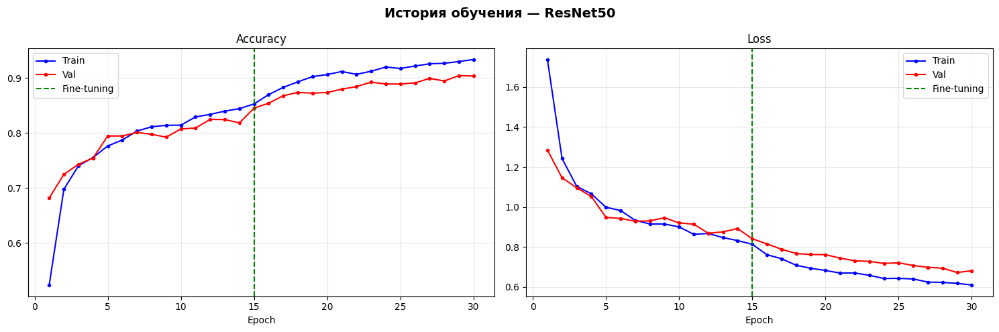

In [14]:
plot_history(h_r1, h_r2, 'ResNet50')

### 5.3 Модель 2: EfficientNetB0

In [15]:
print('='*55); print('МОДЕЛЬ 2: EfficientNetB0'); print('='*55)
effnet = build_efficientnet(freeze_base=True).to(DEVICE)
tr = sum(p.numel() for p in effnet.parameters() if p.requires_grad)
tot= sum(p.numel() for p in effnet.parameters())
print(f'Trainable / Total: {tr:,} / {tot:,}')

МОДЕЛЬ 2: EfficientNetB0
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to C:\Users\User/.cache\torch\hub\checkpoints\efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:02<00:00, 10.7MB/s]


Trainable / Total: 792,850 / 4,800,398


In [16]:
h_e1 = train_stage(effnet, train_loader, val_loader, EPOCHS_STAGE1, LR_STAGE1, 'EfficientNetB0 | Stage 1')


--- EfficientNetB0 | Stage 1 | lr=0.001 ---


  Ep 01/15  loss=1.9743 acc=0.4366  val_loss=1.5036 val_acc=0.6153  [71s]


  Ep 02/15  loss=1.5955 acc=0.5703  val_loss=1.4495 val_acc=0.6327  [70s]


  Ep 03/15  loss=1.5267 acc=0.5920  val_loss=1.4040 val_acc=0.6485  [70s]


  Ep 04/15  loss=1.4621 acc=0.6137  val_loss=1.3411 val_acc=0.6651  [71s]


  Ep 05/15  loss=1.4318 acc=0.6252  val_loss=1.3320 val_acc=0.6545  [72s]


  Ep 06/15  loss=1.4053 acc=0.6335  val_loss=1.2775 val_acc=0.6839  [67s]


  Ep 07/15  loss=1.3837 acc=0.6404  val_loss=1.2612 val_acc=0.6954  [64s]


  Ep 08/15  loss=1.3458 acc=0.6517  val_loss=1.2422 val_acc=0.6937  [63s]


  Ep 09/15  loss=1.3245 acc=0.6649  val_loss=1.1780 val_acc=0.7218  [62s]


  Ep 10/15  loss=1.3227 acc=0.6659  val_loss=1.1902 val_acc=0.7248  [66s]


  Ep 11/15  loss=1.3058 acc=0.6704  val_loss=1.1859 val_acc=0.7175  [63s]


  Ep 12/15  loss=1.3029 acc=0.6690  val_loss=1.1904 val_acc=0.7196  [62s]


  Ep 13/15  loss=1.2829 acc=0.6819  val_loss=1.1753 val_acc=0.7273  [62s]


  Ep 14/15  loss=1.2670 acc=0.6842  val_loss=1.1399 val_acc=0.7329  [63s]


  Ep 15/15  loss=1.2536 acc=0.6867  val_loss=1.1265 val_acc=0.7414  [61s]
  Best val_acc: 0.7414


In [17]:
print('Разморозка EfficientNetB0...')
unfreeze_last(effnet, UNFREEZE_N)
h_e2 = train_stage(effnet, train_loader, val_loader, EPOCHS_STAGE2, LR_STAGE2, 'EfficientNetB0 | Fine-tuning')
torch.save(effnet.state_dict(), 'models/efficientnetb0_onepiece.pth')
print('Сохранено: efficientnetb0_onepiece.pth')

Разморозка EfficientNetB0...
  Trainable: 2,200,306 / 4,800,398

--- EfficientNetB0 | Fine-tuning | lr=1e-05 ---


  Ep 01/15  loss=1.2279 acc=0.6965  val_loss=1.1179 val_acc=0.7490  [61s]


  Ep 02/15  loss=1.1773 acc=0.7141  val_loss=1.1166 val_acc=0.7516  [68s]


  Ep 03/15  loss=1.1471 acc=0.7182  val_loss=1.0727 val_acc=0.7614  [70s]


  Ep 04/15  loss=1.1297 acc=0.7308  val_loss=1.0308 val_acc=0.7810  [70s]


  Ep 05/15  loss=1.1332 acc=0.7332  val_loss=1.0119 val_acc=0.7857  [65s]


  Ep 06/15  loss=1.1062 acc=0.7412  val_loss=1.0180 val_acc=0.7857  [70s]


  Ep 07/15  loss=1.0869 acc=0.7515  val_loss=0.9928 val_acc=0.7908  [61s]


  Ep 08/15  loss=1.0695 acc=0.7539  val_loss=0.9829 val_acc=0.7934  [61s]


  Ep 09/15  loss=1.0545 acc=0.7630  val_loss=0.9692 val_acc=0.7942  [61s]


  Ep 10/15  loss=1.0519 acc=0.7645  val_loss=0.9513 val_acc=0.8074  [61s]


  Ep 11/15  loss=1.0523 acc=0.7625  val_loss=0.9412 val_acc=0.8036  [61s]


  Ep 12/15  loss=1.0334 acc=0.7686  val_loss=0.9336 val_acc=0.8121  [61s]


  Ep 13/15  loss=1.0203 acc=0.7741  val_loss=0.9099 val_acc=0.8185  [61s]


  Ep 14/15  loss=1.0182 acc=0.7747  val_loss=0.9293 val_acc=0.8164  [63s]


  Ep 15/15  loss=0.9983 acc=0.7822  val_loss=0.9094 val_acc=0.8189  [61s]
  Best val_acc: 0.8189
Сохранено: efficientnetb0_onepiece.pth


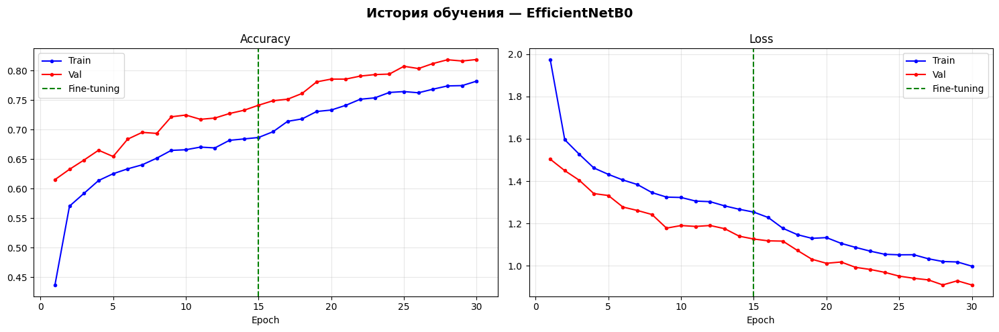

In [18]:
plot_history(h_e1, h_e2, 'EfficientNetB0')

## 6. Оценка моделей

In [19]:
@torch.no_grad()
def get_preds(model, loader):
    model.eval()
    all_true, all_pred, all_prob = [], [], []
    for imgs, labels in tqdm(loader, desc='Evaluating'):
        out   = model(imgs.to(DEVICE))
        probs = torch.softmax(out, 1).cpu().numpy()
        all_true.extend(labels.numpy())
        all_pred.extend(out.argmax(1).cpu().numpy())
        all_prob.extend(probs)
    return np.array(all_true), np.array(all_pred), np.array(all_prob)


def compute_report(y_true, y_pred, name, classes):
    print(f'\n{"="*50}\n{name}\n{"="*50}')
    acc  = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    rec  = recall_score(y_true, y_pred, average='weighted', zero_division=0)
    f1   = f1_score(y_true, y_pred, average='weighted', zero_division=0)
    for k, v in [('Accuracy',acc),('Precision',prec),('Recall',rec),('F1-score',f1)]:
        print(f'  {k:<12}: {v:.4f}')
    print(); print(classification_report(y_true, y_pred, target_names=classes, zero_division=0))
    return {'accuracy':acc,'precision':prec,'recall':rec,'f1':f1}


y_true_r, y_pred_r, y_prob_r = get_preds(resnet, val_loader)
y_true_e, y_pred_e, y_prob_e = get_preds(effnet, val_loader)
metrics_r = compute_report(y_true_r, y_pred_r, 'ResNet50',       classes_ordered)
metrics_e = compute_report(y_true_e, y_pred_e, 'EfficientNetB0', classes_ordered)

Evaluating: 100%|██████████| 74/74 [00:14<00:00,  5.24it/s]


ResNet50
  Accuracy    : 0.9046
  Precision   : 0.9075
  Recall      : 0.9046
  F1-score    : 0.9048

              precision    recall  f1-score   support

         Ace       0.85      0.86      0.86       134
      Akainu       0.94      0.90      0.92       115
       Brook       0.94      0.90      0.92       125
     Chopper       0.89      0.94      0.91       125
   Crocodile       0.94      0.91      0.92       129
      Franky       0.91      0.88      0.89       130
      Jinbei       0.90      0.91      0.91       151
    Kurohige       0.88      0.84      0.86       126
         Law       0.88      0.95      0.92       125
       Luffy       0.97      0.89      0.93       125
      Mihawk       0.89      0.91      0.90       118
        Nami       0.92      0.97      0.94       130
    Rayleigh       0.92      0.89      0.90       150
       Robin       0.80      0.96      0.87       122
       Sanji       0.98      0.97      0.98       123
      Shanks       0.87      0.9

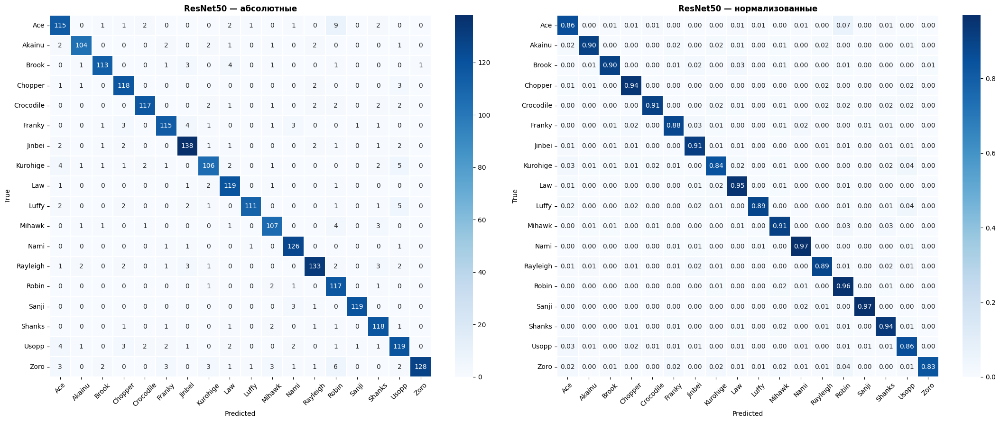

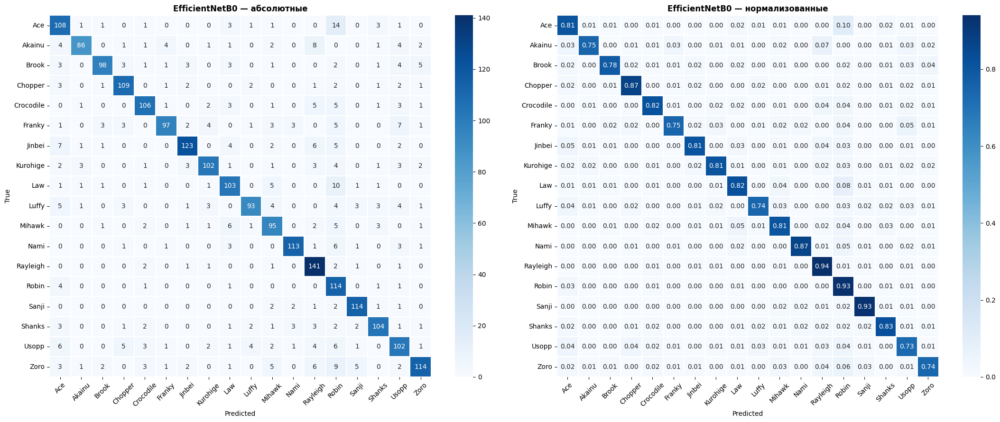

In [20]:
def plot_cm(y_true, y_pred, classes, name):
    cm  = confusion_matrix(y_true, y_pred)
    cmn = cm.astype('float') / cm.sum(axis=1, keepdims=True)
    fig, axes = plt.subplots(1,2,figsize=(22,9))
    for ax, d, t, f in zip(axes, [cm,cmn],
                             [f'{name} — абсолютные', f'{name} — нормализованные'],
                             ['d','.2f']):
        sns.heatmap(d, annot=True, fmt=f, cmap='Blues',
                    xticklabels=classes, yticklabels=classes, ax=ax, linewidths=0.3)
        ax.set_title(t, fontsize=12, fontweight='bold')
        ax.set_xlabel('Predicted'); ax.set_ylabel('True'); ax.tick_params(axis='x', rotation=45)
    plt.tight_layout(); plt.savefig(f'artifacts/{name}_cm.png', dpi=150, bbox_inches='tight'); plt.show()

plot_cm(y_true_r, y_pred_r, classes_ordered, 'ResNet50')
plot_cm(y_true_e, y_pred_e, classes_ordered, 'EfficientNetB0')

## 7. Сравнение моделей

In [21]:
keys = ['accuracy','precision','recall','f1']
cmp = pd.DataFrame({
    'Метрика': ['Accuracy','Precision (w)','Recall (w)','F1-score (w)'],
    'ResNet50': [metrics_r[k] for k in keys],
    'EfficientNetB0': [metrics_e[k] for k in keys],
})
cmp['Лучшая'] = cmp.apply(lambda r: 'ResNet50' if r['ResNet50']>=r['EfficientNetB0'] else 'EfficientNetB0', axis=1)
print(cmp.to_string(index=False))
cmp.to_csv('artifacts/model_comparison.csv', index=False)

      Метрика  ResNet50  EfficientNetB0   Лучшая
     Accuracy  0.904559        0.818918 ResNet50
Precision (w)  0.907541        0.832555 ResNet50
   Recall (w)  0.904559        0.818918 ResNet50
 F1-score (w)  0.904765        0.820846 ResNet50


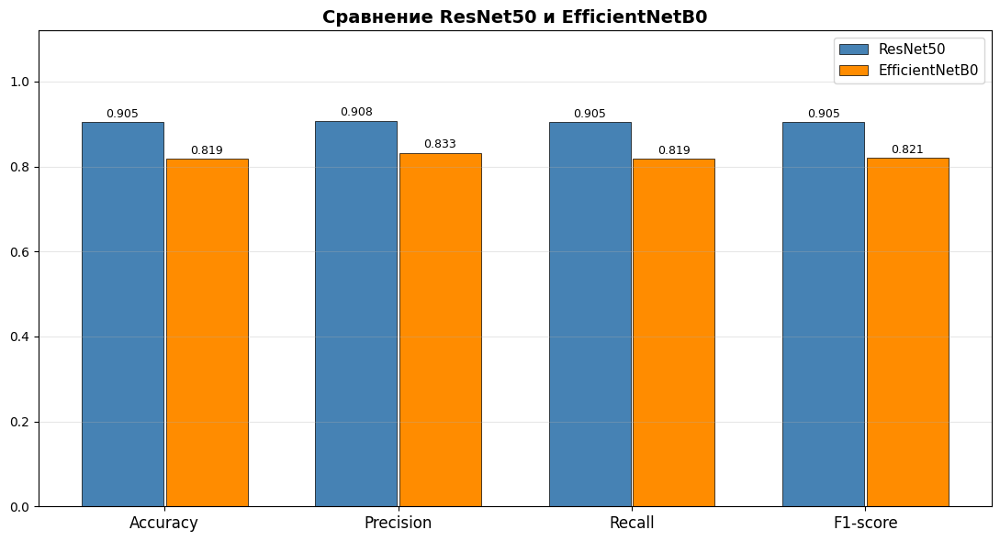


✅ Лучшая модель по F1-score: ResNet50 (0.9048)


In [22]:
x = np.arange(4)
fig, ax = plt.subplots(figsize=(11,6))
b1 = ax.bar(x-0.18, [metrics_r[k] for k in keys], 0.35, label='ResNet50',       color='steelblue',  edgecolor='black', lw=0.5)
b2 = ax.bar(x+0.18, [metrics_e[k] for k in keys], 0.35, label='EfficientNetB0', color='darkorange', edgecolor='black', lw=0.5)
for b in list(b1)+list(b2):
    ax.text(b.get_x()+b.get_width()/2, b.get_height()+0.005, f'{b.get_height():.3f}', ha='center', va='bottom', fontsize=9)
ax.set_ylim(0,1.12); ax.set_xticks(x)
ax.set_xticklabels(['Accuracy','Precision','Recall','F1-score'], fontsize=12)
ax.set_title('Сравнение ResNet50 и EfficientNetB0', fontsize=14, fontweight='bold')
ax.legend(fontsize=11); ax.grid(axis='y', alpha=0.3)
plt.tight_layout(); plt.savefig('artifacts/model_comparison.png', dpi=150, bbox_inches='tight'); plt.show()

winner = 'ResNet50' if metrics_r['f1']>=metrics_e['f1'] else 'EfficientNetB0'
print(f'\n✅ Лучшая модель по F1-score: {winner} ({max(metrics_r["f1"],metrics_e["f1"]):.4f})')

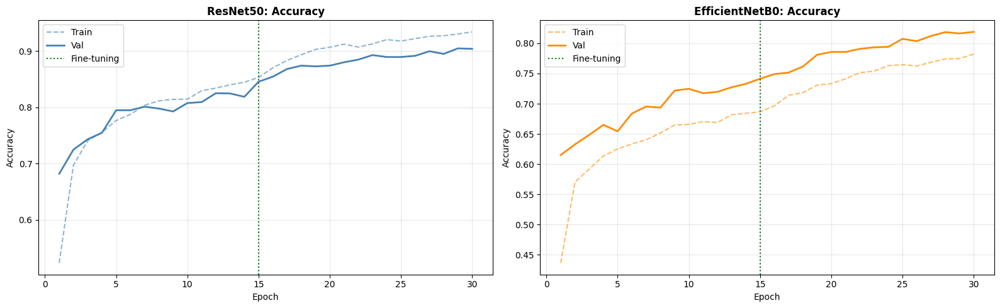

In [23]:
fig, axes = plt.subplots(1,2,figsize=(16,5))
for ax, (h1,h2,name,color) in zip(axes,[
    (h_r1,h_r2,'ResNet50','steelblue'),
    (h_e1,h_e2,'EfficientNetB0','darkorange')
]):
    tr = h1['ta']+h2['ta']; val = h1['va']+h2['va']; sp = len(h1['ta'])
    ep = range(1, len(tr)+1)
    ax.plot(ep,tr,'--',color=color,alpha=0.6,label='Train')
    ax.plot(ep,val,'-',color=color,lw=2,label='Val')
    ax.axvline(sp,color='green',ls=':',lw=1.5,label='Fine-tuning')
    ax.set_title(f'{name}: Accuracy',fontsize=12,fontweight='bold')
    ax.set_xlabel('Epoch'); ax.set_ylabel('Accuracy'); ax.legend(); ax.grid(alpha=0.3)
plt.tight_layout(); plt.savefig('artifacts/learning_curves.png', dpi=150, bbox_inches='tight'); plt.show()

## 8. Grad-CAM

In [24]:
import cv2

class GradCAM:
    def __init__(self, model, layer):
        self.model = model; self.grads = None; self.acts = None
        layer.register_forward_hook(lambda m,i,o: setattr(self,'acts',o.detach()))
        layer.register_full_backward_hook(lambda m,gi,go: setattr(self,'grads',go[0].detach()))

    def __call__(self, t):
        self.model.eval()
        out  = self.model(t.unsqueeze(0).to(DEVICE))
        pred = out.argmax().item()
        self.model.zero_grad(); out[0,pred].backward()
        w   = self.grads.mean(dim=[2,3],keepdim=True)
        cam = torch.relu((w*self.acts).sum(1)).squeeze().cpu().numpy()
        cam = (cam-cam.min())/(cam.max()-cam.min()+1e-8)
        return cam, pred


def overlay(pil_img, cam, alpha=0.45):
    img = np.array(pil_img.resize((IMG_SIZE,IMG_SIZE)))
    h   = cv2.applyColorMap(np.uint8(255*cv2.resize(cam,(IMG_SIZE,IMG_SIZE))), cv2.COLORMAP_JET)
    h   = cv2.cvtColor(h, cv2.COLOR_BGR2RGB)
    return np.uint8((1-alpha)*img + alpha*h)


gcam_r = GradCAM(resnet, resnet.layer4[-1])
gcam_e = GradCAM(effnet, effnet.features[-1])
print('Grad-CAM инициализирован.')

Grad-CAM инициализирован.


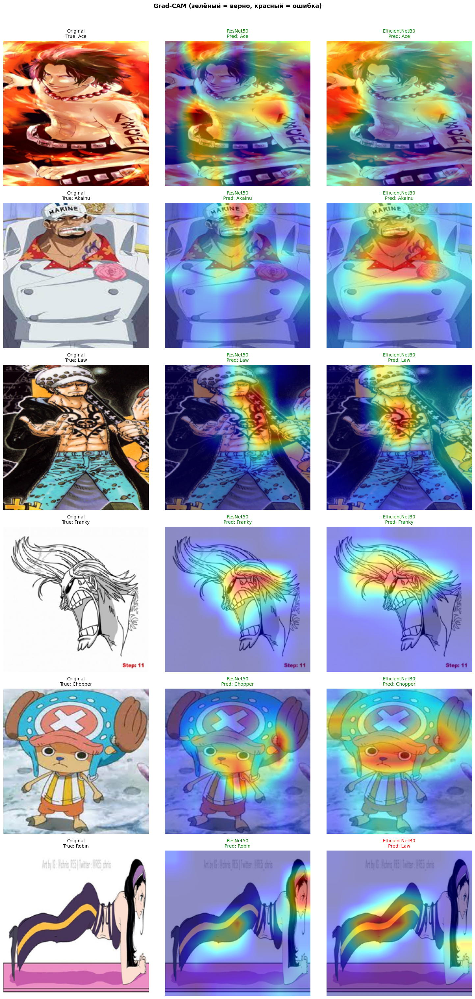

In [25]:
sample_chars = np.random.choice(CLASS_NAMES, 6, replace=False)
samples = []
for cls in sample_chars:
    d = dataset_dir / cls
    imgs = list(d.glob('*.jpg')) + list(d.glob('*.png'))
    if imgs: samples.append((imgs[0], cls))

fig, axes = plt.subplots(len(samples), 3, figsize=(15, 5*len(samples)))
if len(samples) == 1: axes = [axes]
for row, (path, true_cls) in enumerate(samples):
    pil = Image.open(path).convert('RGB')
    t   = val_tf(pil)
    cr, pr = gcam_r(t); ce, pe = gcam_e(t)
    nr = classes_ordered[pr]; ne = classes_ordered[pe]
    axes[row][0].imshow(pil.resize((IMG_SIZE,IMG_SIZE))); axes[row][0].set_title(f'Original\nTrue: {true_cls}', fontsize=10); axes[row][0].axis('off')
    axes[row][1].imshow(overlay(pil,cr)); axes[row][1].set_title(f'ResNet50\nPred: {nr}', fontsize=10, color='green' if nr==true_cls else 'red'); axes[row][1].axis('off')
    axes[row][2].imshow(overlay(pil,ce)); axes[row][2].set_title(f'EfficientNetB0\nPred: {ne}', fontsize=10, color='green' if ne==true_cls else 'red'); axes[row][2].axis('off')

plt.suptitle('Grad-CAM (зелёный = верно, красный = ошибка)', fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout(); plt.savefig('artifacts/gradcam.png', dpi=150, bbox_inches='tight'); plt.show()

## 9. Анализ ошибок

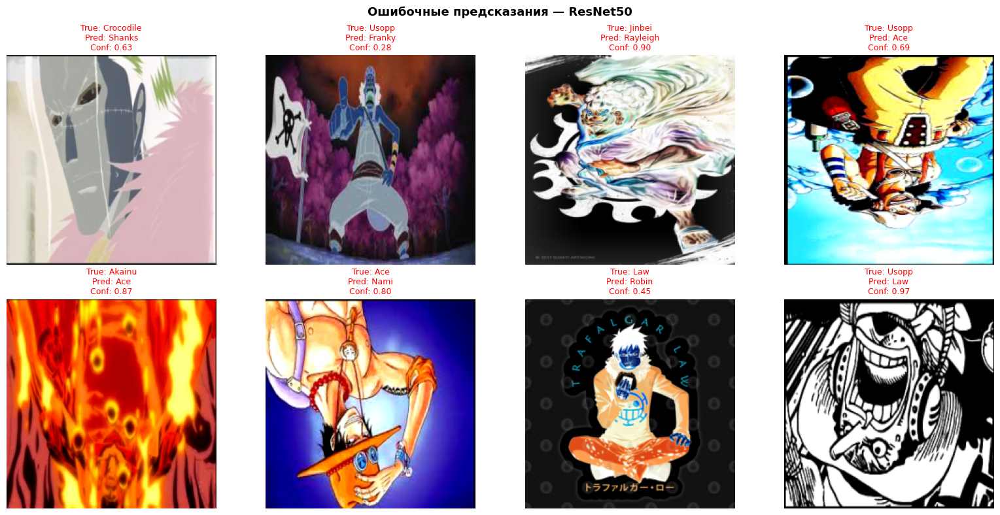

In [26]:
all_val_imgs = []
for imgs_b, _ in val_loader:
    all_val_imgs.extend(imgs_b)
all_val_imgs = all_val_imgs[:len(y_true_r)]

wrong_idx = np.where(y_true_r != y_pred_r)[0]
sample_w  = np.random.choice(wrong_idx, min(8, len(wrong_idx)), replace=False)

fig, axes = plt.subplots(2, 4, figsize=(16,8))
for ax, idx in zip(axes.flatten(), sample_w):
    ax.imshow(denorm(all_val_imgs[idx]))
    ax.set_title(
        f'True: {classes_ordered[y_true_r[idx]]}\nPred: {classes_ordered[y_pred_r[idx]]}\nConf: {y_prob_r[idx][y_pred_r[idx]]:.2f}',
        fontsize=9, color='red'
    )
    ax.axis('off')
plt.suptitle('Ошибочные предсказания — ResNet50', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.savefig('artifacts/misclassified.png', dpi=150, bbox_inches='tight'); plt.show()

## 10. Итоговый отчёт

In [27]:
print('='*60); print('ИТОГОВЫЙ ОТЧЁТ'); print('='*60)
print(f'Датасет  : {total_images} изображений, {NUM_CLASSES} классов')
print(f'Train/Val: {n_train}/{n_val}  |  Device: {DEVICE}')
print()
for name, m in [('ResNet50', metrics_r), ('EfficientNetB0', metrics_e)]:
    print(f'{name}:')
    for k, v in m.items(): print(f'  {k:<12}: {v:.4f}')
    print()
winner = 'ResNet50' if metrics_r['f1']>=metrics_e['f1'] else 'EfficientNetB0'
delta  = abs(metrics_r['f1']-metrics_e['f1'])
print(f'>>> Победитель : {winner}')
print(f'>>> Дельта F1  : {delta:.4f}')

ИТОГОВЫЙ ОТЧЁТ
Датасет  : 11737 изображений, 18 классов
Train/Val: 9390/2347  |  Device: cuda

ResNet50:
  accuracy    : 0.9046
  precision   : 0.9075
  recall      : 0.9046
  f1          : 0.9048

EfficientNetB0:
  accuracy    : 0.8189
  precision   : 0.8326
  recall      : 0.8189
  f1          : 0.8208

>>> Победитель : ResNet50
>>> Дельта F1  : 0.0839
